# 1. beispiel sensor daten
# load data

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
from sklearn import neighbors, datasets
import pandas as pd

sensor = pd.read_csv('https://raw.githubusercontent.com/shadgriffin/machine_failure/master/equipment_failure_data_1.csv')
sensor.head()


#,"DoleLR"	,"PID",	"outpressure",	"inpressure",	"temp"]]

ys_failure=sensor['EQUIPMENT_FAILURE']==1
ys_no_failure=sensor['EQUIPMENT_FAILURE']==0
sensor_failure=sensor[ys_failure].truncate(after=3000)
sensor_no_failure=sensor[ys_no_failure].truncate(after=3)

#sensor_no_failure.head(30)


Xs=sensor[["S15",	"S17"	,"S13","S15","S16"]]#.truncate(after=10000)	
ys=sensor['EQUIPMENT_FAILURE']#.truncate(after=10000)
sensor.head()

sensor_sorted=sensor.sort_values(by=['DATE'], ascending=True)
Xdate=sensor_sorted["DATE"]#.truncate(after=10000)	
yvalue=sensor_sorted["S5"]#.truncate(after=10000)	


df=sensor_sorted


sensor_sorted.head(10)
sensor_sorted_ohne_date=sensor_sorted[['ID', 'REGION_CLUSTER', 'MAINTENANCE_VENDOR', 'MANUFACTURER',
       'WELL_GROUP', 'S15', 'S17', 'S13', 'S5', 'S16', 'S19', 'S18',
       'EQUIPMENT_FAILURE', 'S8', 'AGE_OF_EQUIPMENT']]
sensor_sorted_ohne_date.head()

,ID,REGION_CLUSTER,MAINTENANCE_VENDOR,MANUFACTURER,WELL_GROUP,S15,S17,S13,S5,S16,S19,S18,EQUIPMENT_FAILURE,S8,AGE_OF_EQUIPMENT
83364,100372,B,M,S,4,10.3896,174.73,32.3000,2875.00,8.7674,0.6,3.8,0,0.00,8830
144768,100597,A,O,U,4,22.8000,0.00,35.0900,2667.00,6.5025,8.3,102.2,0,0.00,5510
30732,100139,G,N,T,3,23.5200,0.00,40.7304,3624.92,5.8855,20.3,30.5,0,0.00,990
37311,100164,H,P,S,1,20.1600,0.00,33.3400,3968.00,6.9040,25.3,177.8,0,108.43,2730
51931,100237,E,K,W,3,7.0992,142.74,38.7400,2944.00,7.3688,3.2,6.0,0,0.00,670


In [38]:
sensor_sorted.head()

,ID,DATE,REGION_CLUSTER,MAINTENANCE_VENDOR,MANUFACTURER,WELL_GROUP,S15,S17,S13,S5,S16,S19,S18,EQUIPMENT_FAILURE,S8,AGE_OF_EQUIPMENT,scores,anomaly,anomaly_failure,timestamp
83364,100372,1/1/15,B,M,S,4,10.3896,174.73,32.3000,2875.00,8.7674,0.6,3.8,0,0.00,8830,0.233912,0,1,1/1/15
144768,100597,1/1/15,A,O,U,4,22.8000,0.00,35.0900,2667.00,6.5025,8.3,102.2,0,0.00,5510,0.224812,0,1,1/1/15
30732,100139,1/1/15,G,N,T,3,23.5200,0.00,40.7304,3624.92,5.8855,20.3,30.5,0,0.00,990,0.242085,0,1,1/1/15
37311,100164,1/1/15,H,P,S,1,20.1600,0.00,33.3400,3968.00,6.9040,25.3,177.8,0,108.43,2730,0.213890,0,1,1/1/15
51931,100237,1/1/15,E,K,W,3,7.0992,142.74,38.7400,2944.00,7.3688,3.2,6.0,0,0.00,670,0.238270,0,1,1/1/15


In [7]:
scatterplot(sensor_sorted.index.values[:9000],
                yvalue[:9000], 
                'Date', 
                'Gasoline Price (Dollars Per Gallon)', 
                'US Gulf Coast Gasoline Price Time Series: 2014-Present')

NameError: name 'scatterplot' is not defined

# use pickel save/load model

In [ ]:
import pickle

from sklearn import svm
from sklearn.model_selection import train_test_split
#Create a svm Classifier
#kernel ooption _ linear, rbf, Polynomial 
clf = svm.SVC(C=1.0, kernel='linear') # Linear Kernel



X_train, X_test, y_train, y_test = train_test_split(Xs, ys, random_state=0)

#Train the model using the training sets
clf.fit(X_train, y_train)

#Predict the response for test dataset
y_hat = clf.predict(X_test)
score=clf.score(X_test, y_hat)
score




In [ ]:
#save model
pickle.dump(clf, open('model_clf.pkl','wb'))

model = pickle.load(open('model_clf.pkl','rb'))


In [ ]:
#box plot for each input feature
sensor['S5'].plot(kind='box', subplots=True, sharex=False, sharey=False, figsize=(22,12), 
                                        title='Box Plot for each input variable')
plt.savefig('fruits_boxplot')
plt.show()

# isolation forest

In [12]:
from sklearn.ensemble import IsolationForest
#to_model_column='value'
clf=IsolationForest(n_estimators=10, max_samples='auto', contamination=float(.04), \
                        max_features=1.0, bootstrap=False, n_jobs=-1, verbose=0)
clf.fit(sensor_sorted['S5'].values.reshape(-1,1))

sensor_sorted['scores']=clf.decision_function(sensor_sorted[['S5']])
sensor_sorted['anomaly']=clf.predict(sensor_sorted[['S5']])
sensor_sorted.head()

sensor_sorted.loc[sensor_sorted['anomaly'] == 1,'anomaly'] = 0
sensor_sorted.loc[sensor_sorted['anomaly'] == -1,'anomaly'] = 1

sensor_sorted['anomaly_failure']=sensor_sorted.loc[sensor_sorted['anomaly'] == -1,'anomaly'] = 1
#print anomalies as numbers
sensor_sorted['anomaly'].value_counts()

0    147560
1      2295
Name: anomaly, dtype: int64

In [ ]:
sen=sensor_sorted[sensor_sorted['anomaly'] == 1]
sen.head()

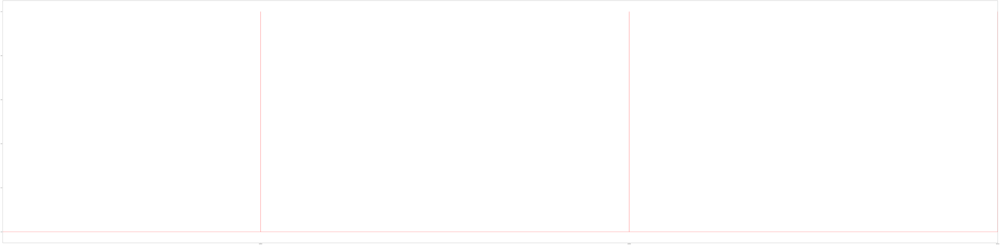

In [13]:
# Using graph_objects
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

#import plotly.plotly as py

import matplotlib.pyplot as plt
from matplotlib import pyplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)
import plotly.graph_objs as go


plt.figure(figsize=(200,50))

#plt.plot(Xdate, yvalue)
plt.plot(Xdate, sensor_sorted['anomaly'], color="r")
plt.xlim(1.3, 4.0)
plt.show()
#iplot(fig)

In [95]:
from matplotlib.figure import Figure
from matplotlib.backends.backend_gtkagg import FigureCanvasGTKAgg as FigureCanvas
from matplotlib.backends.backend_gtkagg import NavigationToolbar2GTKAgg as NavigationToolbar

win = gtk.Window()
win.connect("destroy", lambda x: gtk.main_quit())
win.set_default_size(400,300)
win.set_title("Embedding in GTK")

vbox = gtk.VBox()
win.add(vbox)

fig = Figure(figsize=(5,4), dpi=100)
ax = fig.add_subplot(111)
ax.plot([1,2,3])

canvas = FigureCanvas(fig)  # a gtk.DrawingArea
vbox.pack_start(canvas)
toolbar = NavigationToolbar(canvas, win)
vbox.pack_start(toolbar, False, False)

win.show_all()
gtk.main()

ModuleNotFoundError: No module named 'matplotlib.backends.backend_gtkagg'

In [ ]:
plt.figure(figsize=(60,10))

plt.plot(Xdate, yvalue)
plt.show()
#iplot(fig)

In [16]:
df=sensor_sorted

df['anomaly']=sensor_sorted['S5']

df['timestamp']=sensor_sorted['DATE']

def plot_anomaly(df,metric_name):
   # df.timestamp = pd.to_datetime(df['timestamp'].astype(str), format="%Y-%m-%d %H:%M:%S")
    dates = df.timestamp
    #identify the anomaly points and create a array of its values for plot
    bool_array = (abs(sensor_sorted['anomaly']) > 0)
    actuals = sensor_sorted['S5'][-len(bool_array):]
    anomaly_points = bool_array * actuals
    anomaly_points[anomaly_points == 0] = np.nan
    #A dictionary for conditional format table based on anomaly
    color_map = {0: "blue", 1: "red"}
#Table which includes Date,Actuals,Change occured from previous point
    table = go.Table(
    domain=dict(x=[0, 1],
                y=[0, 0.3]),
    columnwidth=[1, 2],
    # columnorder=[0, 1, 2,],
    header=dict(height=20,
                values=[['<b>Date</b>'], ['<b>Actual Values </b>'],
                        ],
                font=dict(color=['rgb(45, 45, 45)'] * 5, size=14),
                fill=dict(color='#d562be')),
    cells=dict(values=[sensor_sorted.round(3)[k].tolist() for k in ['DATE', 'S5']],
               line=dict(color='#506784'),
               align=['center'] * 5,
               font=dict(color=['rgb(40, 40, 40)'] * 5, size=12),
               # format = [None] + [",.4f"] + [',.4f'],
               # suffix=[None] * 4,
               suffix=[None] + [''] + [''] + ['%'] + [''],
               height=27,
               fill=dict(color=[sensor_sorted['anomaly'].map(color_map)],#map based on anomaly level from dictionary
               )
               ))
    #Plot the actuals points
    Actuals = go.Scatter(name='Actuals',
                     x=sensor_sorted['DATE'],
                     y=sensor_sorted['S5'],
                     xaxis='x1', yaxis='y1',
                     mode='lines',
                     marker=dict(size=12,
                                 line=dict(width=1),
                                 color="blue"))
    #Highlight the anomaly points
    anomalies_map = go.Scatter(name="Anomaly",
                               showlegend=True,
                               x=sensor_sorted['DATE'],
                               y=anomaly_points,
                               mode='markers',
                               xaxis='x1',
                               yaxis='y1',
                               marker=dict(color="red",
                                           size=11,
                                           line=dict(
                                               color="red",
                                               width=2)))
    axis = dict(
        showline=True,
        zeroline=False,
        showgrid=True,
        mirror=True,
        ticklen=4,
        gridcolor='#ffffff',
        tickfont=dict(size=10))
    layout = dict(
        width=1000,
        height=865,
        autosize=False,
        title=metric_name,
        margin=dict(t=75),
        showlegend=True,
        xaxis1=dict(axis, **dict(domain=[0, 1], anchor='y1', showticklabels=True)),
        yaxis1=dict(axis, **dict(domain=[2 * 0.21 + 0.20, 1], anchor='x1', hoverformat='.2f')))
    fig = go.Figure(data=[table, anomalies_map, Actuals], layout=layout)
    iplot(fig)
    pyplot.show()
plot_anomaly(sensor_sorted,'anomalies')

ValueError: 
    Invalid element(s) received for the 'color' property of table.cells.fill
        Invalid elements include: [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]

    The 'color' property is a color and may be specified as:
      - A hex string (e.g. '#ff0000')
      - An rgb/rgba string (e.g. 'rgb(255,0,0)')
      - An hsl/hsla string (e.g. 'hsl(0,100%,50%)')
      - An hsv/hsva string (e.g. 'hsv(0,100%,100%)')
      - A named CSS color:
            aliceblue, antiquewhite, aqua, aquamarine, azure,
            beige, bisque, black, blanchedalmond, blue,
            blueviolet, brown, burlywood, cadetblue,
            chartreuse, chocolate, coral, cornflowerblue,
            cornsilk, crimson, cyan, darkblue, darkcyan,
            darkgoldenrod, darkgray, darkgrey, darkgreen,
            darkkhaki, darkmagenta, darkolivegreen, darkorange,
            darkorchid, darkred, darksalmon, darkseagreen,
            darkslateblue, darkslategray, darkslategrey,
            darkturquoise, darkviolet, deeppink, deepskyblue,
            dimgray, dimgrey, dodgerblue, firebrick,
            floralwhite, forestgreen, fuchsia, gainsboro,
            ghostwhite, gold, goldenrod, gray, grey, green,
            greenyellow, honeydew, hotpink, indianred, indigo,
            ivory, khaki, lavender, lavenderblush, lawngreen,
            lemonchiffon, lightblue, lightcoral, lightcyan,
            lightgoldenrodyellow, lightgray, lightgrey,
            lightgreen, lightpink, lightsalmon, lightseagreen,
            lightskyblue, lightslategray, lightslategrey,
            lightsteelblue, lightyellow, lime, limegreen,
            linen, magenta, maroon, mediumaquamarine,
            mediumblue, mediumorchid, mediumpurple,
            mediumseagreen, mediumslateblue, mediumspringgreen,
            mediumturquoise, mediumvioletred, midnightblue,
            mintcream, mistyrose, moccasin, navajowhite, navy,
            oldlace, olive, olivedrab, orange, orangered,
            orchid, palegoldenrod, palegreen, paleturquoise,
            palevioletred, papayawhip, peachpuff, peru, pink,
            plum, powderblue, purple, red, rosybrown,
            royalblue, rebeccapurple, saddlebrown, salmon,
            sandybrown, seagreen, seashell, sienna, silver,
            skyblue, slateblue, slategray, slategrey, snow,
            springgreen, steelblue, tan, teal, thistle, tomato,
            turquoise, violet, wheat, white, whitesmoke,
            yellow, yellowgreen
      - A list or array of any of the above

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import eia
def retrieve_time_series(api, series_ID):
    """
    Return the time series dataframe, based on API and unique Series ID
    Arguments:
        api: API that we're connected to
        series_ID: string. Name of the series that we want to pull from the EIA API
    Outputs:
        df: Pandas dataframe of time series
    """
    #Retrieve Data By Series ID 
   # series_search = api.data_by_series(series=series_ID)
    ##Create a pandas dataframe from the retrieved time series
   # df = pd.DataFrame(series_search)
    return df
def scatterplot(x_data, y_data, x_label, y_label, title):
    """
    Arguments:
        x_data: Series. Desired x-axis for scatterplot.
        y_data: Series. Desired y-axis for scatterplot.
        x_label: String. Label for x-axis.
        y_label: String. Label for y-axis.
        title: String. Title of plot
    Outputs:
        Scatterplot in console.
    """
    fig, ax = plt.subplots()
    ax.scatter(x_data, y_data, s = 30, color = '#539caf', alpha = 0.75)
    ax.set_title(title)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    fig.autofmt_xdate()
    
#####EXECUTE IN MAIN BLOCK
#Create EIA API using your specific API key
api_key = 'YOUR API KEY HERE'
api = eia.API(api_key)
    
#Pull the oil WTI price data
series_ID='PET.EER_EPMRU_PF4_RGC_DPG.D'
sensor_sorted=retrieve_time_series(api, series_ID)
sensor_sorted.reset_index(level=0, inplace=True)
#Rename the columns for easer analysis
sensor_sorted.rename(columns={'index':'Date',
            sensor_sorted.columns[1]:'Gasoline_Price'}, 
            inplace=True)
     
#Visualize anomalies using matplotlib function



scatterplot(sensor_sorted['DATE'],
                sensor_sorted['S5'], 
                'Date', 
                'Gasoline Price (Dollars Per Gallon)', 
                'US Gulf Coast Gasoline Price Time Series: 2014-Present')

NameError: name 'df' is not defined

In [29]:
# evaluate model performance with outliers removed using isolation forest
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import IsolationForest
from sklearn.metrics import mean_absolute_error
# load the dataset
#url = 'https://raw.githubusercontent.com/jbrownlee/Datasets/master/housing.csv'
#df = read_csv(url, header=None)
# retrieve the array
#data = df.values
# split into input and output elements
#X, y = data[:, :-1], data[:, -1]
X=Xs
y=ys
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)
# summarize the shape of the training dataset
print(X_train.shape, y_train.shape)
# identify outliers in the training dataset
iso = IsolationForest(contamination=0.1)
yhat = iso.fit_predict(X_train)
# select all rows that are not outliers
#mask = yhat != -1
#X_train, y_train = X_train[mask, :], y_train[mask]
# summarize the shape of the updated training dataset
print(X_train.shape, y_train.shape)
# fit the model
model = LinearRegression()
model.fit(X_train, y_train)
# evaluate the model
yhat = model.predict(X_test)
# evaluate predictions
mae = mean_absolute_error(y_test, yhat)
print('MAE: %.3f' % mae)

(6700, 5) (6700,)
(6700, 5) (6700,)
MAE: 0.005


In [22]:
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2


In [30]:
yhat
iso

IsolationForest(contamination=0.1)

In [75]:
pip install EIA-python

Note: you may need to restart the kernel to use updated packages.


 #  isolation forest - neues beispiel

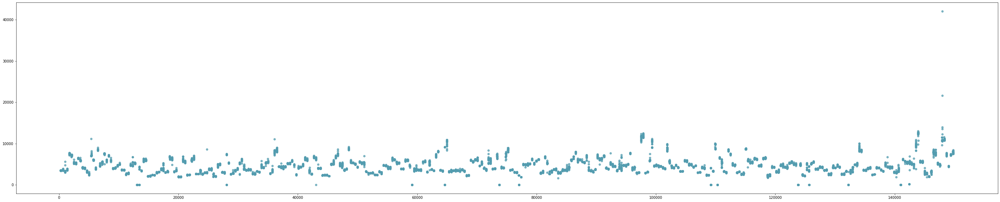

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import eia
def retrieve_time_series(api, series_ID):
    """
    Return the time series dataframe, based on API and unique Series ID
    Arguments:
        api: API that we're connected to
        series_ID: string. Name of the series that we want to pull from the EIA API
    Outputs:
        df: Pandas dataframe of time series
    """
    #Retrieve Data By Series ID 
    series_search = api.data_by_series(series=series_ID)
    ##Create a pandas dataframe from the retrieved time series
    df = pd.DataFrame(series_search)
    return df
def scatterplot(x_data, y_data, x_label, y_label, title):
    """
    Arguments:
        x_data: Series. Desired x-axis for scatterplot.
        y_data: Series. Desired y-axis for scatterplot.
        x_label: String. Label for x-axis.
        y_label: String. Label for y-axis.
        title: String. Title of plot
    Outputs:
        Scatterplot in console.

    """
    #fig, ax = plt
    
    plt.figure(figsize=(50, 10))
    plt.scatter(x_data, y_data, s = 30, color = '#539caf', alpha = 0.75)
    #plt.set_title(title)
    #plt.set_xlabel(x_label)
    #plt.set_ylabel(y_label)
    #fig.autofmt_xdate()
    
#####EXECUTE IN MAIN BLOCK
#Create EIA API using your specific API key
#api_key = 'YOUR API KEY HERE'
#api = eia.API(api_key)
    
#Pull the oil WTI price data
#series_ID='PET.EER_EPMRU_PF4_RGC_DPG.D'
gasoline_price_df=sensor_sorted
#gasoline_price_df.reset_index(level=0, inplace=True)
#Rename the columns for easer analysis
gasoline_price_df.rename(columns={'index':'DATE',
            gasoline_price_df.columns[1]:'S5'}, 
            inplace=True)
     
#Visualize anomalies using matplotlib function
scatterplot(sensor_sorted.index.values[-9000:],
                yvalue[-9000:], 
                'Date', 
                'Gasoline Price (Dollars Per Gallon)', 
                'US Gulf Coast Gasoline Price Time Series: 2014-Present')
    

In [49]:

from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import IsolationForest
from sklearn.metrics import mean_absolute_error

def isolation_forest_anomaly_detection(df, 
                                       column_name, 
                                       outliers_fraction):
    """
    In this definition, time series anomalies are detected using an Isolation Forest algorithm.
    Arguments:
        df: Pandas dataframe
        column_name: string. Name of the column that we want to detect anomalies in
        outliers_fraction: float. Percentage of outliers allowed in the sequence.
    Outputs:
        df: Pandas dataframe with column for detected Isolation Forest anomalies (True/False)
    """
    #Scale the column that we want to flag for anomalies
    min_max_scaler = preprocessing.StandardScaler()
    np_scaled = min_max_scaler.fit_transform(df[[column_name]])
    scaled_time_series = pd.DataFrame(np_scaled)
    # train isolation forest 
    model =  IsolationForest(contamination = outliers_fraction, behaviour='new')
    model.fit(scaled_time_series)
    #Generate column for Isolation Forest-detected anomalies
    isolation_forest_anomaly_column = column_name+'_Isolation_Forest_Anomaly'
    df[isolation_forest_anomaly_column] = model.predict(scaled_time_series)
    df[isolation_forest_anomaly_column] = df[isolation_forest_anomaly_column].map( {1: False, -1: True} )
    return df
##EXECUTE IN MAIN BLOCK
#APPLY ISOLATION FOREST TO DETECT ANOMALIES
gasoline_price_df=isolation_forest_anomaly_detection(df=sensor_sorted_ohne_date, 
                                                         column_name='S5', 
                                                         outliers_fraction=.04)
#Re-plot time series with color coding for anomaly column
scatterplot_with_color_coding(sensor_sorted_ohne_date.index.values[:9000],
                                  yvalue[:9000], 
                                  gasoline_price_df['Gasoline_Price_Isolation_Forest_Anomaly'],
                                  'Date', 
                                  'Gasoline Price (Dollars Per Gallon)', 
                                  'Gasoline Prices, Color-Coded on Isolation Forest Anomalies') 

TypeError: __init__() got an unexpected keyword argument 'behaviour'

In [106]:
Xdate.shape

(149855,)

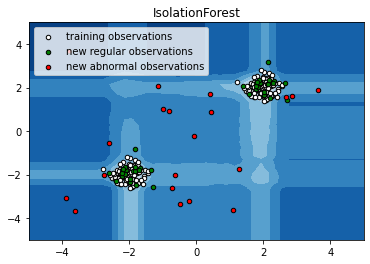

In [51]:
 
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest

rng = np.random.RandomState(42)

# Generate train data
X = 0.3 * rng.randn(100, 2)
X_train = np.r_[X + 2, X - 2]
# Generate some regular novel observations
X = 0.3 * rng.randn(20, 2)
X_test = np.r_[X + 2, X - 2]
# Generate some abnormal novel observations
X_outliers = rng.uniform(low=-4, high=4, size=(20, 2))

# fit the model
clf = IsolationForest(max_samples=100, random_state=rng)
clf.fit(X_train)
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)
y_pred_outliers = clf.predict(X_outliers)

# plot the line, the samples, and the nearest vectors to the plane
xx, yy = np.meshgrid(np.linspace(-5, 5, 50), np.linspace(-5, 5, 50))
Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.title("IsolationForest")
plt.contourf(xx, yy, Z, cmap=plt.cm.Blues_r)

b1 = plt.scatter(X_train[:, 0], X_train[:, 1], c='white',
                 s=20, edgecolor='k')
b2 = plt.scatter(X_test[:, 0], X_test[:, 1], c='green',
                 s=20, edgecolor='k')
c = plt.scatter(X_outliers[:, 0], X_outliers[:, 1], c='red',
                s=20, edgecolor='k')
plt.axis('tight')
plt.xlim((-5, 5))
plt.ylim((-5, 5))
plt.legend([b1, b2, c],
           ["training observations",
            "new regular observations", "new abnormal observations"],
           loc="upper left")
plt.show()

# 2. beispiel:  isolation forest- regression beispiel

https://towardsdatascience.com/isolation-forest-with-statistical-rules-4dd27dad2da9#:~:text=With%20isolation%20forest%20we%20had,our%20data%20to%20be%20anomalous.&text=Isolation%20forest%20separates%20each%20point,representing%20a%20node%20in%20tree

In [8]:
# load new datset
import pandas as pd
import numpy as np
full_df=pd.read_csv('https://raw.githubusercontent.com/numenta/NAB/master/data/realAWSCloudwatch/ec2_cpu_utilization_5f5533.csv')

df= full_df
full_df.head()

,timestamp,value
0,2014-02-14 14:27:00,51.846
1,2014-02-14 14:32:00,44.508
2,2014-02-14 14:37:00,41.244
3,2014-02-14 14:42:00,48.568
4,2014-02-14 14:47:00,46.714


In [50]:
print(full_df['timestamp'].min())
print(full_df['timestamp'].max())
print(len(full_df['timestamp']))

2014-02-14 14:27:00
2014-02-28 14:22:00
4032


In [9]:
# Using graph_objects
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import matplotlib.pyplot as plt
from matplotlib import pyplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)
import plotly.graph_objs as go
fig = go.Figure(data=[go.Scatter(x=df['timestamp'], y=df['value'])])
iplot(fig)

In [ ]:
plot_data=go.Scatter(x=df['timestamp'], y=df['value'])
fig=go.Figure(data=[plot_data])
iplot(fig)

In [77]:
full_df['timestamp'].describe

<bound method NDFrame.describe of 0       2014-02-14 14:27:00
1       2014-02-14 14:32:00
2       2014-02-14 14:37:00
3       2014-02-14 14:42:00
4       2014-02-14 14:47:00
               ...         
4027    2014-02-28 14:02:00
4028    2014-02-28 14:07:00
4029    2014-02-28 14:12:00
4030    2014-02-28 14:17:00
4031    2014-02-28 14:22:00
Name: timestamp, Length: 4032, dtype: object>

## isolation forest - model

In [52]:
from sklearn.ensemble import IsolationForest
#to_model_column='value'
clf=IsolationForest(n_estimators=10, max_samples='auto', contamination=float(.04)) # cotamination boudary, how many should be outliners
                       # max_features=1.0, bootstrap=False, n_jobs=-1, random_state=42, verbose=0,behaviour='new')
clf.fit(df[['value']])
df['scores']=clf.decision_function(df[['value']])
df['anomaly']=clf.fit_predict(df[['value']])
df.head()
df.loc[df['anomaly'] == 1,'anomaly'] = 0
df.loc[df['anomaly'] == -1,'anomaly'] = 1
#df.value_counts()
df['anomaly'].value_counts()

0    3870
1     162
Name: anomaly, dtype: int64

In [53]:
#df=sensor_sorted
df.columns
df.dtypes
#df.head()

timestamp     object
value        float64
scores       float64
anomaly        int64
dtype: object

In [54]:
#df=df[[ 'REGION_CLUSTER', 'MAINTENANCE_VENDOR', 'MANUFACTURER',
 #      'WELL_GROUP', 'S15', 'S17', 'S13', 'S5', 'S16', 'S19', 'S18',
  #     'EQUIPMENT_FAILURE', 'S8', 'AGE_OF_EQUIPMENT', 'scores', 'anomaly',
   #    'anomaly_failure' ]]
#df.head()

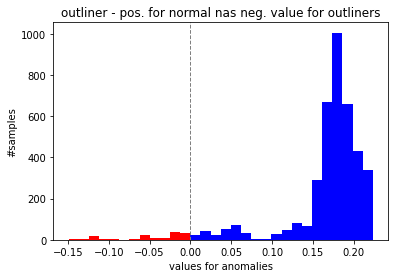

In [55]:

import matplotlib.pyplot as plt
import numpy as np

# generate fake data
N = 1000
data = df['scores']

n_bins = 30
heights, bins, _ = plt.hist(data, bins=n_bins) # get positions and heights of bars

bin_width = np.diff(bins)[0]
bin_pos = bins[:-1] + bin_width / 2

#plt.figure()

mask = (bin_pos >= 0)

# plot data in two steps
plt.bar(bin_pos[mask], heights[mask], width=bin_width, color='b')
plt.bar(bin_pos[~mask], heights[~mask], width=bin_width, color='r')

plt.title('outliner - pos. for normal nas neg. value for outliners')
plt.xlabel("values for anomalies")
plt.ylabel("#samples")
plt.axvline(x=0, linestyle='--',linewidth=1, color='grey')

plt.show()

#df['scores'].hist()

# plot the anomalies

In [56]:
# plot_anomaly(df,metric_name) is working fine
# plots the anomalies due ti time 

def plot_anomaly(df,metric_name):
    df.timestamp = pd.to_datetime(df['timestamp'].astype(str), format="%Y-%m-%d %H:%M:%S")
    #df.timestamp = pd.to_datetime(df['timestamp'].astype(str), format="%d/%m/%Y")
    dates = df.timestamp
    #identify the anomaly points and create a array of its values for plot
    bool_array = (abs(df['anomaly']) > 0)
    actuals = df["value"][-len(bool_array):]
    anomaly_points = bool_array * actuals
    anomaly_points[anomaly_points == 0] = np.nan
    #A dictionary for conditional format table based on anomaly
    color_map = {0: "blue", 1: "red"}
#Table which includes Date,Actuals,Change occured from previous point
    table = go.Table(
    domain=dict(x=[0, 1],
                y=[0, 0.3]),
    columnwidth=[1, 2],
    # columnorder=[0, 1, 2,],
    header=dict(height=20,
                values=[['<b>Date</b>'], ['<b>Actual Values </b>'],
                        ],
                font=dict(color=['rgb(45, 45, 45)'] * 5, size=14),
                fill=dict(color='#d562be'
                
                )),
    cells=dict(values=[df.round(3)[k].tolist() for k in ['timestamp', 'value']],
               line=dict(color='#506784'),
               align=['center'] * 5,
               font=dict(color=['rgb(40, 40, 40)'] * 5, size=12),
               # format = [None] + [",.4f"] + [',.4f'],
               # suffix=[None] * 4,
               suffix=[None] + [''] + [''] + ['%'] + [''],
               height=27,
               fill=dict(color=[df['anomaly'].map(color_map)],#map based on anomaly level from dictionary
               )
               ))
    #Plot the actuals points
    Actuals = go.Scatter(name='Actuals',
                     x=dates,
                     y=df['value'],
                     xaxis='x1', yaxis='y1',
                     mode='lines',
                     marker=dict(size=12,
                                 line=dict(width=1),
                                 color="blue"))
    #Highlight the anomaly points
    anomalies_map = go.Scatter(name="Anomaly",
                               showlegend=True,
                               x=dates,
                               y=anomaly_points,
                               mode='markers',
                               xaxis='x1',
                               yaxis='y1',
                               marker=dict(color="red",
                                           size=11,
                                           line=dict(
                                               color="red",
                                               width=2)))
    axis = dict(
        showline=True,
        zeroline=False,
        showgrid=True,
        mirror=True,
        ticklen=4,
        gridcolor='#ffffff',
        tickfont=dict(size=10))
    layout = dict(
        width=1000,
        height=865,
        autosize=False,
        title=metric_name,
        margin=dict(t=75),
        showlegend=True,
        xaxis1=dict(axis, **dict(domain=[0, 1], anchor='y1', showticklabels=True)),
        yaxis1=dict(axis, **dict(domain=[2 * 0.21 + 0.20, 1], anchor='x1', hoverformat='.2f')))
    fig = go.Figure(data=[table, anomalies_map, Actuals], layout=layout)
    iplot(fig)
    pyplot.show()


# isolation forest witrh quartile more dynamic

In [57]:
"""
dynamic parameter, due to quartile:
 Once we finalize our model based on this and predict the future points then our cutoff on scores for contamination might vary to give 4% of points as anomalous but the distribution of scores might change. To overcome instead of an hard coded percentage of points always being labeled as anomalies irrespective of change in scores we can use some statistical algorithm like Z-Score or IQR on the scores to detect those changes in scores and classify anomalies better.

https://towardsdatascience.com/isolation-forest-with-statistical-rules-4dd27dad2da9#:~:text=With%20isolation%20forest%20we%20had,our%20data%20to%20be%20anomalous.&text=Isolation%20forest%20separates%20each%20point,representing%20a%20node%20in%20tree

"""

def iqr_bounds(scores,k=1.5):
    q1 = scores.quantile(0.25)
    q3 = scores.quantile(0.75)
    iqr = q3 - q1
    lower_bound=(q1 - k * iqr)
    upper_bound=(q3 + k * iqr)
    print("Lower bound:{} \nUpper bound:{}".format(lower_bound,upper_bound))
    return lower_bound,upper_bound
lower_bound,upper_bound=iqr_bounds(df['scores'],k=2)

lower_bound,upper_bound=iqr_bounds(df['scores'],k=2)
df['anomaly']=0
df['anomaly']=(df['scores'] < lower_bound) |(df['scores'] > upper_bound)
df['anomaly']=df['anomaly'].astype(int)
plot_anomaly(df,'iqr second case')

Lower bound:0.10157379797739724 
Upper bound:0.25591465566192234
Lower bound:0.10157379797739724 
Upper bound:0.25591465566192234


In [58]:
#plot the grapgh with anomalies
plot_anomaly(df,'anomalies')  


In [59]:
#plot the grapgh with anomalies
plot_anomaly(df,'anomalies')  


## LocalOutlierFactor - model

In [60]:
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import mean_absolute_error
# load the dataset

# identify outliers in the training dataset
lof = LocalOutlierFactor(novelty=True)


lof.fit(df[['value']])
df['scores']=lof.decision_function(df[['value']])
df['anomaly']=lof.predict(df[['value']])
df.head()
df.loc[df['anomaly'] == 1,'anomaly'] = 0
df.loc[df['anomaly'] == -1,'anomaly'] = 1
#df.value_counts()
df['anomaly'].value_counts()

0    4000
1      32
Name: anomaly, dtype: int64

In [132]:
#plot the grapgh with anomalies
plot_anomaly(df,'anomalies localfoactory')  

## one svm machine- model

In [140]:
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.svm import OneClassSVM
from sklearn.metrics import mean_absolute_error

# identify outliers in the training dataset
svm = OneClassSVM(nu=0.04)


svm.fit(df[['value']])
df['scores']=svm.decision_function(df[['value']])
df['anomaly']=svm.predict(df[['value']])
df.head()
df.loc[df['anomaly'] == 1,'anomaly'] = 0
df.loc[df['anomaly'] == -1,'anomaly'] = 1
#df.value_counts()
df['anomaly'].value_counts()

0    3812
1     220
Name: anomaly, dtype: int64

In [136]:
#plot the grapgh with anomalies
plot_anomaly(df,'anomalies svm') 

## EllipticEnvelope- model

In [138]:
from sklearn.covariance import EllipticEnvelope
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.svm import OneClassSVM
from sklearn.metrics import mean_absolute_error

# identify outliers in the training dataset
# identify outliers in the training dataset
elev = EllipticEnvelope(contamination=0.04)


elev.fit(df[['value']])
df['scores']=elev.decision_function(df[['value']])
df['anomaly']=elev.predict(df[['value']])
df.head()
df.loc[df['anomaly'] == 1,'anomaly'] = 0
df.loc[df['anomaly'] == -1,'anomaly'] = 1
#df.value_counts() get numbers of anomalies
df['anomaly'].value_counts()

0    3870
1     162
Name: anomaly, dtype: int64

In [139]:
#plot the grapgh with anomalies
plot_anomaly(df,'anomalies EllipticEnvelope') 

# robust random cut forest

In [3]:
#pip install rrcf

In [61]:
import numpy as np
import rrcf

# Generate data
n = 730
A = 50
center = 100
phi = 30
T = 2*np.pi/100
t = np.arange(n)
sin = A*np.sin(T*t-phi*T) + center
sin[235:255] = 80

# Set tree parameters
num_trees = 40
shingle_size = 4
tree_size = 256

# Create a forest of empty trees
forest = []
for _ in range(num_trees):
    tree = rrcf.RCTree()
    forest.append(tree)
    
# Use the "shingle" generator to create rolling window
points = rrcf.shingle(sin, size=shingle_size)

# Create a dict to store anomaly score of each point
avg_codisp = {}

# For each shingle...
for index, point in enumerate(points):
    # For each tree in the forest...
    for tree in forest:
        # If tree is above permitted size, drop the oldest point (FIFO)
        if len(tree.leaves) > tree_size:
            tree.forget_point(index - tree_size)
        # Insert the new point into the tree
        tree.insert_point(point, index=index)
        # Compute codisp on the new point and take the average among all trees
        if not index in avg_codisp:
            avg_codisp[index] = 0
        avg_codisp[index] += tree.codisp(index) / num_trees

In [62]:
import json
import numpy as np
import rrcf

np.random.seed(0)
n = 100
d = 3
X = np.random.randn(n, d)
Z = np.copy(X)
Z[90:, :] = 1

tree = rrcf.RCTree(X)
duplicate_tree = rrcf.RCTree(Z)

tree_seeded = rrcf.RCTree(random_state=0)
duplicate_tree_seeded = rrcf.RCTree(random_state=np.random.RandomState(0))

deck = np.arange(n, dtype=int)
np.random.shuffle(deck)
indexes = deck[:5]

def test_batch():
    # Check stored bounding boxes and leaf counts after instantiating from batch
    branches = []
    tree.map_branches(tree.root, op=tree._get_nodes, stack=branches)
    leafcount = tree._count_leaves(tree.root)
    assert (leafcount == n)
    for branch in branches:
        leafcount = tree._count_leaves(branch)
        assert (leafcount == branch.n)
        bbox = tree.get_bbox(branch)
        assert (bbox == branch.b).all()

def test_codisp():
    for i in range(100):
        codisp = tree.codisp(i)
        assert codisp > 0

def test_disp():
    for i in range(100):
        disp = tree.disp(i)
        assert disp > 0

def test_forget_batch():
    # Check stored bounding boxes and leaf counts after forgetting points
    for index in indexes:
        forgotten = tree.forget_point(index)
        branches = []
        tree.map_branches(tree.root, op=tree._get_nodes, stack=branches)
        for branch in branches:
            leafcount = tree._count_leaves(branch)
            try:
                assert (leafcount == branch.n)
            except:
                print(forgotten.x)
                print('Computed:\n', leafcount)
                print('Stored:\n', branch.n)
                raise
            bbox = tree.get_bbox(branch)
            try:
                assert np.allclose(bbox, branch.b)
            except:
                print(forgotten.x)
                print('Computed:\n', bbox)
                print('Stored:\n', branch.b)
                raise

def test_insert_batch():
    # Check stored bounding boxes and leaf counts after inserting points
    for index in indexes:
        x = np.random.randn(d)
        tree.insert_point(x, index=index)
        branches = []
        tree.map_branches(tree.root, op=tree._get_nodes, stack=branches)
        for branch in branches:
            leafcount = tree._count_leaves(branch)
            try:
                assert (leafcount == branch.n)
            except:
                print(x)
                print('Computed:\n', leafcount)
                print('Stored:\n', branch.n)
                raise
            bbox = tree.get_bbox(branch)
            try:
                assert np.allclose(bbox, branch.b)
            except:
                print(x)
                print('Computed:\n', bbox)
                print('Stored:\n', branch.b)
                raise

def test_batch_with_duplicates():
    # Instantiate tree with 10 duplicates
    leafcount = duplicate_tree._count_leaves(tree.root)
    assert (leafcount == n)
    for i in range(90, 100):
        try:
            assert duplicate_tree.leaves[i].n == 10
        except:
            print(i)
            print(duplicate_tree.leaves[i].n)
            raise

def test_insert_duplicate():
    # Insert duplicate point
    point = (1., 1., 1.)
    leaf = duplicate_tree.insert_point(point, index=100)
    assert leaf.n == 11
    for i in range(90, 100):
        try:
            assert duplicate_tree.leaves[i].n == 11
        except:
            print(i)
            print(duplicate_tree.leaves[i].n)
            raise

def test_find_duplicate():
    # Find duplicate point
    point = (1, 1, 1)
    duplicate = duplicate_tree.find_duplicate(point)
    assert duplicate is not None

def test_forget_duplicate():
    # Forget duplicate point
    leaf = duplicate_tree.forget_point(100)
    for i in range(90, 100):
        assert duplicate_tree.leaves[i].n == 10

def test_shingle():
    shingle = rrcf.shingle(X, 3)
    step_0 = next(shingle)
    step_1 = next(shingle)
    assert (step_0[1] == step_1[0]).all()

def test_random_state():
    # The two trees should have the exact same random-cuts
    points = np.random.uniform(size=(100, 5))
    for idx, point in enumerate(points):
        tree_seeded.insert_point(point, idx)
        duplicate_tree_seeded.insert_point(point, idx)
    assert str(tree_seeded) == str(duplicate_tree_seeded)

def test_insert_depth():
    tree = rrcf.RCTree()
    tree.insert_point([0., 0.], index=0)
    tree.insert_point([0., 0.], index=1)
    tree.insert_point([0., 0.], index=2)
    tree.insert_point([0., 1.], index=3)
    tree.forget_point(index=3)
    min_depth = min(leaf.d for leaf in tree.leaves.values())
    assert min_depth >= 0

def test_to_dict():
    tree = rrcf.RCTree()
    tree.insert_point([0., 0.], index=0)
    tree.insert_point([0., 0.], index=1)
    tree.insert_point([0., 0.], index=2)
    tree.insert_point([0., 1.], index=3)
    obj = tree.to_dict()
    X = np.random.randn(10, 3)
    X[5] = X[2]
    tree = rrcf.RCTree(X)
    obj = tree.to_dict()
    with open('tree.json', 'w') as outfile:
        json.dump(obj, outfile)

def test_from_dict():
    num_leaves = 10
    with open('tree.json', 'r') as infile:
        obj = json.load(infile)
    tree = rrcf.RCTree()
    tree.load_dict(obj)
    tree = rrcf.RCTree.from_dict(obj)
    # Ensure we didn't drop any duplicate leaves
    assert len(tree.leaves) == num_leaves

def test_print():
    tree = rrcf.RCTree()
    tree.insert_point([0., 0.], index=0)
    tree.insert_point([0., 0.], index=1)
    tree.insert_point([0., 1.], index=3)
    print(list(tree.leaves.values())[0])
    print(tree.root)

In [63]:
test_print()

Leaf(0)
Branch(q=0, p=0.00)


# 3. beispiel RRCF - model und plot
## https://github.com/kLabUM/rrcf/blob/master/docs/streaming.md 

In [30]:
# load new datset
import pandas as pd
import numpy as np
full_df=pd.read_csv('https://raw.githubusercontent.com/numenta/NAB/master/data/realAWSCloudwatch/ec2_cpu_utilization_5f5533.csv')

df= full_df
full_df.head()

,timestamp,value
0,2014-02-14 14:27:00,51.846
1,2014-02-14 14:32:00,44.508
2,2014-02-14 14:37:00,41.244
3,2014-02-14 14:42:00,48.568
4,2014-02-14 14:47:00,46.714


In [3]:
# Using graph_objects
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import matplotlib.pyplot as plt
from matplotlib import pyplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)
import plotly.graph_objs as go
fig = go.Figure(data=[go.Scatter(x=df['timestamp'], y=df['value'])])
iplot(fig)

In [4]:
# Using graph_objects
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import matplotlib.pyplot as plt
from matplotlib import pyplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)
import plotly.graph_objs as go
#plot with
fig = go.Figure(data=[go.Scatter(x=df.index.values  , y=df['value'])])
iplot(fig)

Text(0.5, 1.0, 'Sine wave with injected anomaly (red) and anomaly score (blue)')

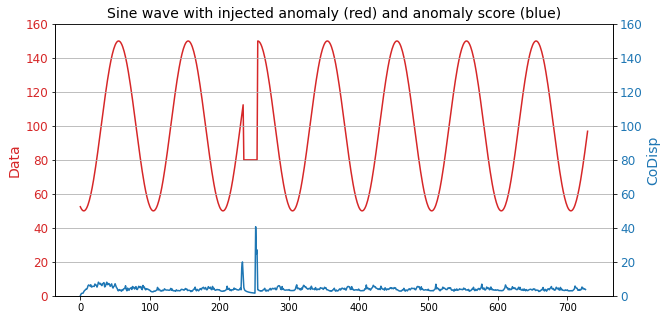

In [6]:
import numpy as np
import rrcf
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Generate data
n = 730
A = 50
center = 100
phi = 30
T = 2*np.pi/100
t = np.arange(n)
sin = A*np.sin(T*t-phi*T) + center
sin[235:255] = 80



# Set tree parameters
num_trees = 40
shingle_size = 4
tree_size = 256

# Create a forest of empty trees
forest = []
for _ in range(num_trees):
    tree = rrcf.RCTree()
    forest.append(tree)


# Use the "shingle" generator to create rolling window
points = rrcf.shingle(sin, size=shingle_size)

# Create a dict to store anomaly score of each point
avg_codisp = {}

# For each shingle...
for index, point in enumerate(points):
    # For each tree in the forest...
    for tree in forest:
        # If tree is above permitted size...
        if len(tree.leaves) > tree_size:
            # Drop the oldest point (FIFO)
            tree.forget_point(index - tree_size)
        # Insert the new point into the tree
        tree.insert_point(point, index=index)
        # Compute codisp on the new point...
        new_codisp = tree.codisp(index)
        # And take the average over all trees
        if not index in avg_codisp:
            avg_codisp[index] = 0
        avg_codisp[index] += new_codisp / num_trees





fig, ax1 = plt.subplots(figsize=(10, 5))

color = 'tab:red'
ax1.set_ylabel('Data', color=color, size=14)
ax1.plot(sin, color=color)
ax1.tick_params(axis='y', labelcolor=color, labelsize=12)
ax1.set_ylim(0,160)
ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('CoDisp', color=color, size=14)
ax2.plot(pd.Series(avg_codisp).sort_index(), color=color)
ax2.tick_params(axis='y', labelcolor=color, labelsize=12)
ax2.grid('off')
ax2.set_ylim(0, 160)
plt.title('Sine wave with injected anomaly (red) and anomaly score (blue)', size=14)        


## rrcf example with sensor data

Text(0.5, 1.0, 'sensor signal with anomaly  and anomaly CoDisp score ')

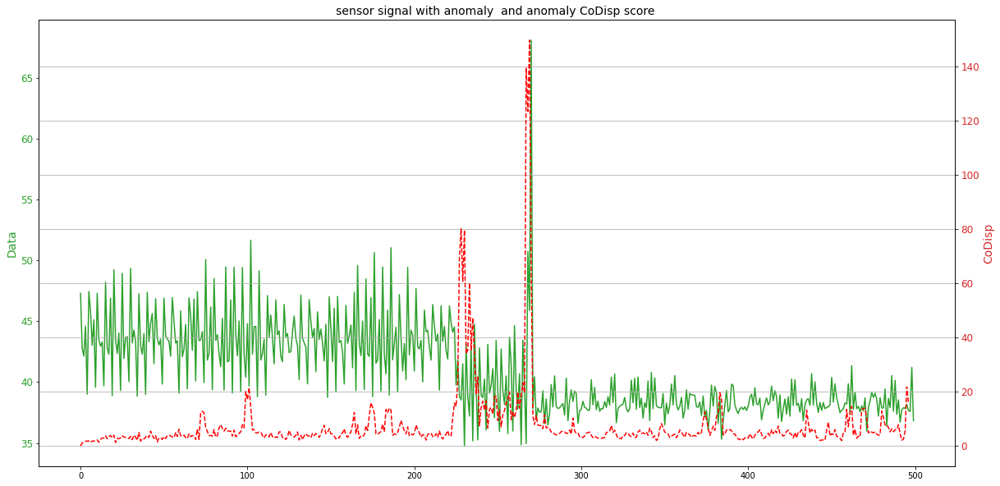

In [29]:
import numpy as np
import rrcf
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


df1=df['value'][2700:3200].reset_index()
df1['value'].shape

# Generate data
#n = 730
#A = 50
#center = 100
#phi = 30
#T = 2*np.pi/100
#t = np.arange(n)
#sin = A*np.sin(T*t-phi*T) + center
#sin[235:255] = 80

sin=df1['value']


# Set tree parameters
num_trees = 40
shingle_size = 4
tree_size = 256

# Create a forest of empty trees
forest = []
for _ in range(num_trees):
    tree = rrcf.RCTree()
    forest.append(tree)


# Use the "shingle" generator to create rolling window
points = rrcf.shingle(sin, size=shingle_size)

# Create a dict to store anomaly score of each point
avg_codisp = {}

# For each shingle...
for index, point in enumerate(points):
    # For each tree in the forest...
    for tree in forest:
        # If tree is above permitted size...
        if len(tree.leaves) > tree_size:
            # Drop the oldest point (FIFO)
            tree.forget_point(index - tree_size)
        # Insert the new point into the tree
        tree.insert_point(point, index=index)
        # Compute codisp on the new point...
        new_codisp = tree.codisp(index)
        # And take the average over all trees
        if not index in avg_codisp:
            avg_codisp[index] = 0
        avg_codisp[index] += new_codisp / num_trees





fig, ax1 = plt.subplots(figsize=(20, 10))

color = 'tab:green'
ax1.set_ylabel('Data', color=color, size=14)
ax1.plot(sin, color=color)
ax1.tick_params(axis='y', labelcolor=color, labelsize=12)
#ax1.set_ylim(0,160)
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('CoDisp', color=color, size=14)
ax2.plot(pd.Series(avg_codisp).sort_index(), "r-",linestyle='dashed')
ax2.tick_params(axis='y', labelcolor=color, labelsize=12)
ax2.grid('off')
#ax2.set_ylim(0, 160)
plt.title('sensor signal with anomaly  and anomaly CoDisp score ', size=14)  